# Ejemplo de Inferencia

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
! pip install --upgrade ultralytics opencv-python supervision

  Using cached ultralytics-8.2.61-py3-none-any.whl (804 kB)
  Attempting uninstall: ultralytics
    Found existing installation: ultralytics 8.1.34
    Uninstalling ultralytics-8.1.34:
      Successfully uninstalled ultralytics-8.1.34


In [3]:
!pip install -q git+https://github.com/THU-MIG/yolov10.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [4]:
import os
import shutil
import json
from ultralytics import YOLOv10
import supervision as sv
import cv2
from google.colab.patches import cv2_imshow

In [5]:
!ls -l

total 8
drwx------ 5 root root 4096 Jul 21 13:27 drive
drwxr-xr-x 1 root root 4096 Jul 18 13:22 sample_data


## Ajustes Iniciales

In [6]:
# Nombre del alumno
student_name = "mateo_rovere"

# Ruta al archivo de pesos
model_path = "/content/drive/MyDrive/Proyecto_Final_CV/model/weights/best_yolov10x.pt"

# Ruta al directorio que contiene las imagenes
imgs_dir = "/content/drive/MyDrive/Proyecto_Final_CV/data/eval/images/val"

# Ruta al directorio de destino de las detecciones
base_dir = "/content/drive/MyDrive/Proyecto_Final_CV/data/out"
dets_dir = os.path.join(base_dir, student_name)

In [7]:
# Reestablecimiento del directorio de destino (eliminacion)
if os.path.exists(dets_dir):
    shutil.rmtree(dets_dir)

os.makedirs(dets_dir)

## Inferencia

### Formato YOLOv5 para las salidas de las inferencias

Estas son las celdas para que el estudiante complete con su código de inferencia.

Debe generar un archivo con las detecciones en formato YOLOv5, donde cada línea contiene:
 cls, xc, yx, w, h, c

* **cls**: número de índice de la clase

* **xc**: coordenada x al centro de la caja delimitadora (bbox)

* **yx**: coordenada y al centro de la caja delimitadora (bbox)

* **w**: ancho de la caja delimitadora

* **h**: alto de la caja delimitadora

* **c**: certeza del modelo sobre la clasificacíon (confidence)


 Todas las coordenadas deben ser relativas: [0 ... 1]

NOTA: Si utiliza un modelo YoloV8 de ultralytics, pueder llamar al método result.save_txt(file_name, save_conf=True)

### Formato para los archivos de envido.json

Además de las detecciones anteriores, debe existir un archivo llamado envido.json con la siguiente estructura:

```json
{
    "IMG_20240630_174514649_HDR.jpg": {
        "total_cards": 3,
        "cards": {
            "E": [],
            "C": [
                12
            ],
            "B": [
                11
            ],
            "O": [
                10
            ]
        },
        "points": 0,
        "figure": "N/A"
    },
    "IMG_20240630_173918579.jpg": {
        "total_cards": 2,
        "cards": {
            "E": [],
            "C": [],
            "B": [],
            "O": [
                9,
                8
            ]
        },
        "points": 0,
        "figure": "N/A"
    },
  ...
}
```

Esto indica que hay un total de tres cartas, que son el 5 y el 1 de Copas, y el 2 de Basto, que dan 26 puntos de envido de Copa.

Este archivo debe contener una clave con el nombre de archivo, donde cada elemento es a su vez un objeto cons las claves detalladas.

Revise el archivo gt_envido.json para analizar todas las posibilidades.

### DEMO: cálculo del envido

A continuación hay una implementación del cálculo de los puntos a modo de ejemplo, que sirve de referencia para evaluar el algoritmo de evaluación.

**ESTA ES LA SECCIÓN QUE CADA ALUMNO REEMPLAZARIA CON SU CODIGO**

In [8]:
model = YOLOv10(model_path)
resultados = {}

def clasificar_cartas(array_detecciones):
    cartas = {"E": [], "C": [], "B": [], "O": [],"J":[]}
    for deteccion in array_detecciones:
        if len(deteccion) > 1:
            try:
                numero = int(deteccion[:-1])  # Todo menos el último carácter representa el número
                palo = deteccion[-1]  # El último carácter representa el palo
                if palo in cartas:
                    cartas[palo].append(numero)
            except ValueError:
                print(f"Error al convertir {deteccion} a número y palo")
        else:
          palo = deteccion
          numero = True

    return cartas

def calcular_puntos(cartas):
    puntos = 0
    if len(array_detecciones) == 3:
        for numeros in cartas.values():
            for num in numeros:
                if num in [8, 9, True]:
                    puntos = "Error: Números no válidos para el truco"
                    return puntos

            if len(numeros) > 1:
                puntos = 20
                cartas_suma = [num for num in numeros if num not in [10, 11, 12]]
                cartas_no_suma = [num for num in numeros if num in [10, 11, 12]]

                cartas_no_suma = [0] * len(cartas_no_suma)

                cartas_validas = sorted(cartas_suma + cartas_no_suma, reverse=True)

                puntos += sum(cartas_validas[:2])

    return puntos

for filename in os.listdir(imgs_dir):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        img_path = os.path.join(imgs_dir, filename)
        img = cv2.imread(img_path)

        results = model(img)[0]
        txt_filename = os.path.splitext(filename)[0] + ".txt"
        txt_path = os.path.join(imgs_dir, txt_filename)
        results.save_txt(txt_path, save_conf=True)
        detections = sv.Detections.from_ultralytics(results)
        array_detecciones = detections.__getitem__('class_name')

        cartas = clasificar_cartas(array_detecciones)

        puntos = calcular_puntos(cartas)

        resultados[filename] = {
            "total_cards": len(array_detecciones),
            "cards": cartas,
            "points": puntos,
            "figure": "N/A" # no quedo claro que va en figure
        }

        print(f"Resultados para {filename}:")
        print(f"Array de detecciones: {array_detecciones}")
        print(f"Últimos caracteres: {[s[-1] for s in array_detecciones]}")
        print(f"Cartas: {cartas}")
        print(f"Puntos: {puntos}")

%store resultados


0: 640x512 1 1O, 7539.7ms
Speed: 16.4ms preprocess, 7539.7ms inference, 9.1ms postprocess per image at shape (1, 3, 640, 512)


Resultados para IMG_20240630_174005265.jpg:
Array de detecciones: ['1O']
Últimos caracteres: ['O']
Cartas: {'E': [], 'C': [], 'B': [], 'O': [1], 'J': []}
Puntos: 0

0: 512x640 1 5B, 2698.0ms
Speed: 8.0ms preprocess, 2698.0ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)
Resultados para IMG_20240630_174459285.jpg:
Array de detecciones: ['5B']
Últimos caracteres: ['B']
Cartas: {'E': [], 'C': [], 'B': [5], 'O': [], 'J': []}
Puntos: 0

0: 640x512 1 8B, 2751.4ms
Speed: 5.8ms preprocess, 2751.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 512)
Resultados para IMG_20240630_174105714.jpg:
Array de detecciones: ['8B']
Últimos caracteres: ['B']
Cartas: {'E': [], 'C': [], 'B': [8], 'O': [], 'J': []}
Puntos: 0

0: 640x512 1 10E, 1 5O, 1 6O, 4515.3ms
Speed: 8.1ms preprocess, 4515.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 512)
Resultados para IMG_20240630_174418639.jpg:
Array de detecciones: ['6O' '5O' '10E']
Últimos caracteres: ['O', 'O', 'E

## Escritura del archivo envido.json

In [9]:
%store -r resultados

with open(os.path.join(dets_dir, "envido.json"), "w") as jf:
    json.dump(resultados, jf, indent=4)

#Ejemplo visual


0: 640x512 1 8B, 2777.0ms
Speed: 6.1ms preprocess, 2777.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 512)


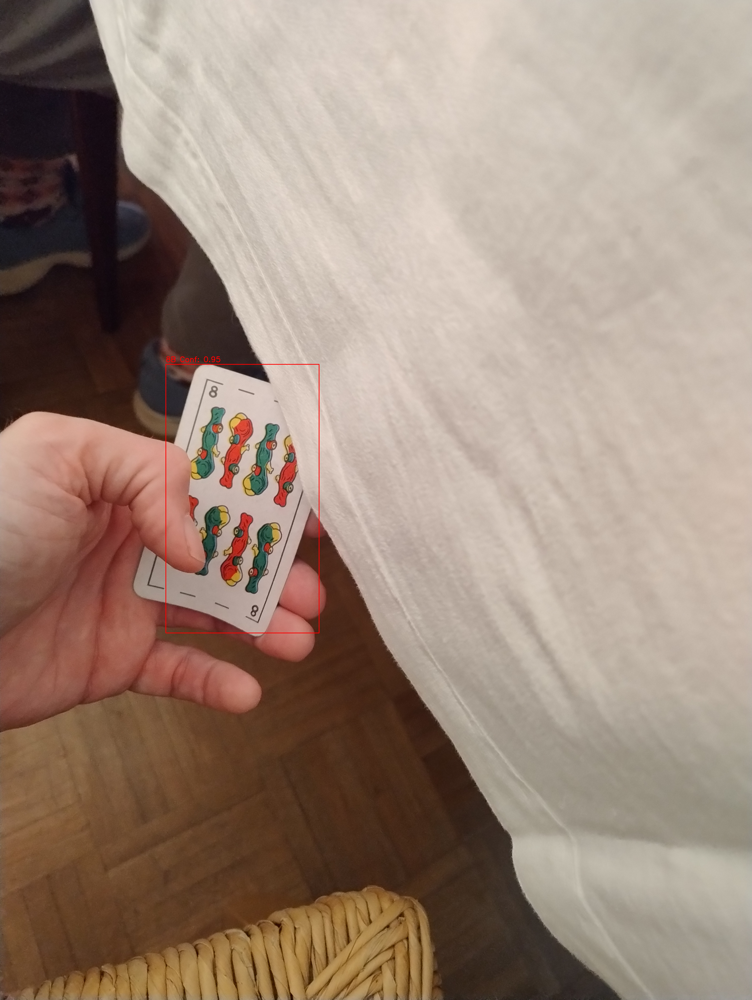

In [10]:
model = YOLOv10(model_path)

class_names = ['10B', '10C', '10E', '10O', '11B', '11C', '11E', '11O', '12B', '12C', '12E', '12O',
                '1B', '1C', '1E', '1O', '2B', '2C', '2E', '2O', '3B', '3C', '3E', '3O', '4B', '4C',
                '4E', '4O', '5B', '5C', '5E', '5O', '6B', '6C', '6E', '6O', '7B', '7C', '7E', '7O',
                '8B', '8C', '8E', '8O', '9B', '9C', '9E', '9O', 'J']

class_dict = {i: name for i, name in enumerate(class_names)}

image_path = os.path.join(imgs_dir, os.listdir(imgs_dir)[2])
image = cv2.imread(image_path)

results = model(image)[0]

for bbox, conf, cls in zip(results.boxes.xyxy.cpu().numpy(), results.boxes.conf.cpu().numpy(), results.boxes.cls.cpu().numpy()):
    x1, y1, x2, y2 = map(int, bbox)
    label = class_dict[int(cls)]
    confidence = f"Conf: {conf:.2f}"

    image = cv2.rectangle(image, (x1, y1), (x2, y2), (0, 0, 255), 2)
    image = cv2.putText(image, f"{label} {confidence}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

cv2_imshow(image)